<a href="https://colab.research.google.com/github/yablockoo/GB/blob/AI/HW7AI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1) Краткий обзор статьи посвященной EfficientDet алгоритму для object detection

Мною была взята статья описываюзая сеть EfficientDet.

Статья от 27 Jul 2020: https://arxiv.org/abs/1911.09070

Пример реализации: https://github.com/xuannianz/EfficientDet

Обзорная статья: https://medium.com/codex/review-efficientdet-scalable-and-efficient-object-detection-ed9ebc70f873

Было много предыдущих работ, направленных на разработку более эффективных архитектур детекторов. Часто такие работы имеют тенденцию достигать большей эффективности, жертвуя точностью. Возникает естественный вопрос: можно ли построить масштабируемую архитектуру обнаружения с более высокой точностью и большей эффективностью при широком спектре ограничений ресурсов? Создатели EfficientDet считают, что нашли ответ на этот вопрос.
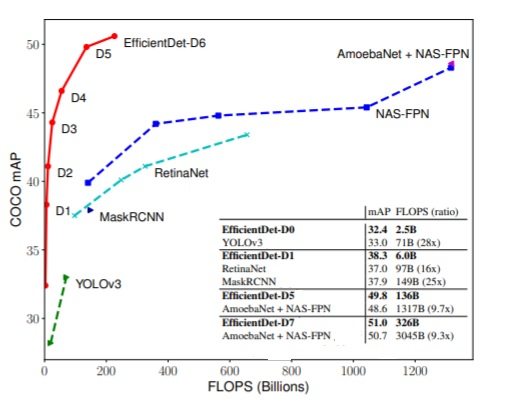

EfficientDet
достигает гораздо более высокой точности при меньшем количестве вычислений

## Архитектура

Общая архитектура EfficientDet в значительной степени соответствует парадигме одноступенчатых (one-stage) детекторов. За основу взята EfficientNet, предобученная на ImageNet, к ней приделан слой со взвешенной двунаправленной
пирамидой признаков (BiFPN), за которым идёт классовая и блочная сеть для генерации предсказаний класса объекта и ограничивающего прямоугольника соответственно.

Главная фишка нейросети кроется в двунаправленной взвешанной пирамиде признаков называемой BiFPN.

Идея создания двунаправленной пирамиды признаков появилась после изучения производительности и эффективности сетей для улучшения масштабирования: Feature Pyramid Network(FPN), PANet и NAS-FPN. PANet достигает лучшей точности, чем FPN и NAS-FPN, но с затратами на большее количество параметров и вычислений. Чтобы повысить эффективность модели, предлагалось несколько оптимизаций для кросс-масштабных соединений:


*   во-первых, удалить те узлы, которые имеют только один входной фронт. Интуиция проста: если у узла есть только один входной фронт без объединения функций, то он будет иметь меньший вклад в сеть объектов, которая нацелена на объединение различных функций. 
*   Во-вторых, добавить дополнительное ребро из исходного ввода в выходной узел, если они находятся на одном уровне, чтобы объединить больше функций без дополнительных затрат.
*   В-третьих, в отличие от PANet, который имеет только один путь сверху вниз и один путь снизу вверх, мы рассматриваем каждый двунаправленный (сверху вниз и снизу вверх) путь как один слой сети объектов и повторяем один и тот же уровень несколько раз, чтобы включить более высокоуровневый фьюжн.





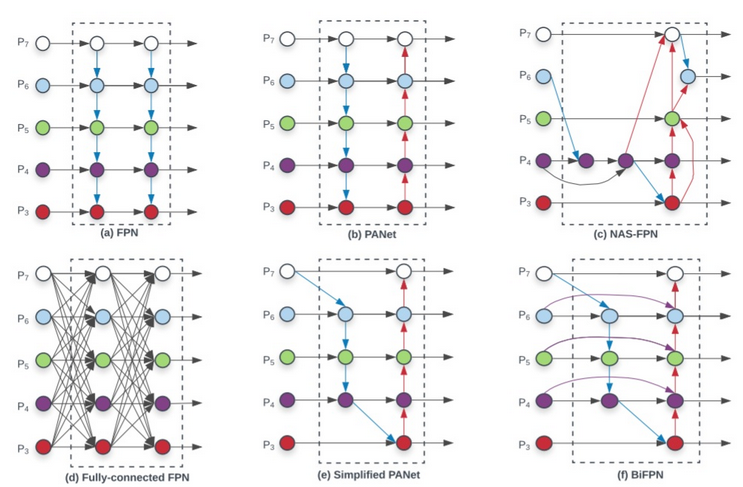

Конструкция сети признаков —
(a) FPN вводит нисходящий путь для того чтобы сплавить многомасштабные характеристики от уровня 3 к 7 (P3 — P7);
(b) PANet добавляет дополнительный путь снизу вверх поверх FPN;
© NAS-FPN использует нейронную архитектуру
поиск для поиска нерегулярной топологии сети объектов;
(d) добавляет дорогие соединения от всех входных объектов к выходным объектам;
(e) упрощает панель путем удаления некоторых узлов;
(f) наш BiFPN с более лучшими компромиссами точности и эффективности.


В результате систематического изучения различных вариантов проектирования архитектуры сети для эффективного обнаружения объектов предложена взвешенная двунаправленная функциональная сеть и настраиваемый метод составного масштабирования для повышения точности и эффективности. На основе этих оптимизаций было разработано новое семейство детекторов под названием EfficientDet, которые последовательно достигают большей точности и эффективности, чем предшествующий уровень техники, при широком спектре ограничений по ресурсам. В частности, наш EfficientDet-D7 достигает современной точности с меньшим количеством параметров и FLOPS, чем лучший из существующих детекторов. EfficientDet также в 3,2 раза быстрее на GPU и в 8,1 раза быстрее на CPU.

В настоящее время актуальные нейросети-детекторы на голову выше EfficientDet представленной в статье. 

MobileNet — оптимальна только для CPU / мобильных-CPU / слабым устройствам

YOLOv5 full/tiny — оптимальна для GPU и NPU/VPU/TPU

EfficientDet — уступает всем выше приведённым сетям.


В итоге EfficientDet стала развитием FPN c оптимизацией производительности и эффективности для улучшения масштабирования.

# 2) Запустить детектор (ssdMobile_v2 или faster_rcnn, или любой другой детектор) для своей картинки и найти 10 объектов, 100 объектов.

In [2]:
import tensorflow as tf

import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

2.8.2
The following GPU devices are available: /device:GPU:0


In [32]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=100, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

Image downloaded to /tmp/tmp2nqj8zcw.jpg.


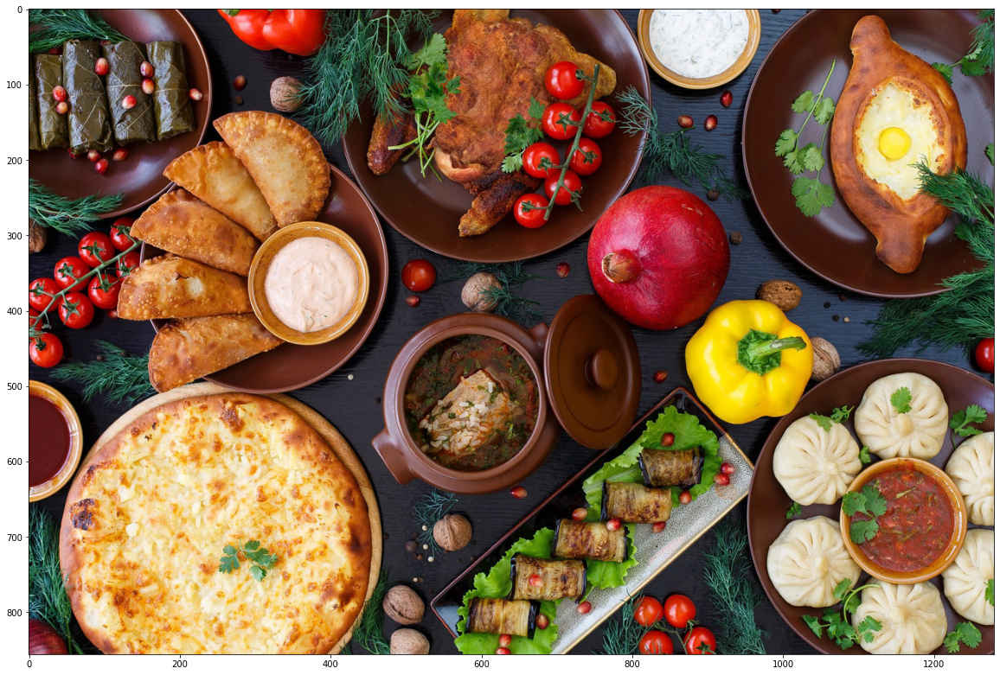

In [23]:
image_url = "https://s2.best-wallpaper.net/wallpaper/2560x1440/1908/Many-kinds-of-food-meat-tomatoes-pie_2560x1440.jpg"  #@param 
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

In [5]:


module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1" #@param ["https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1", "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"]

detector = hub.load(module_handle).signatures['default']



INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [6]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img


In [7]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  1.2776219844818115


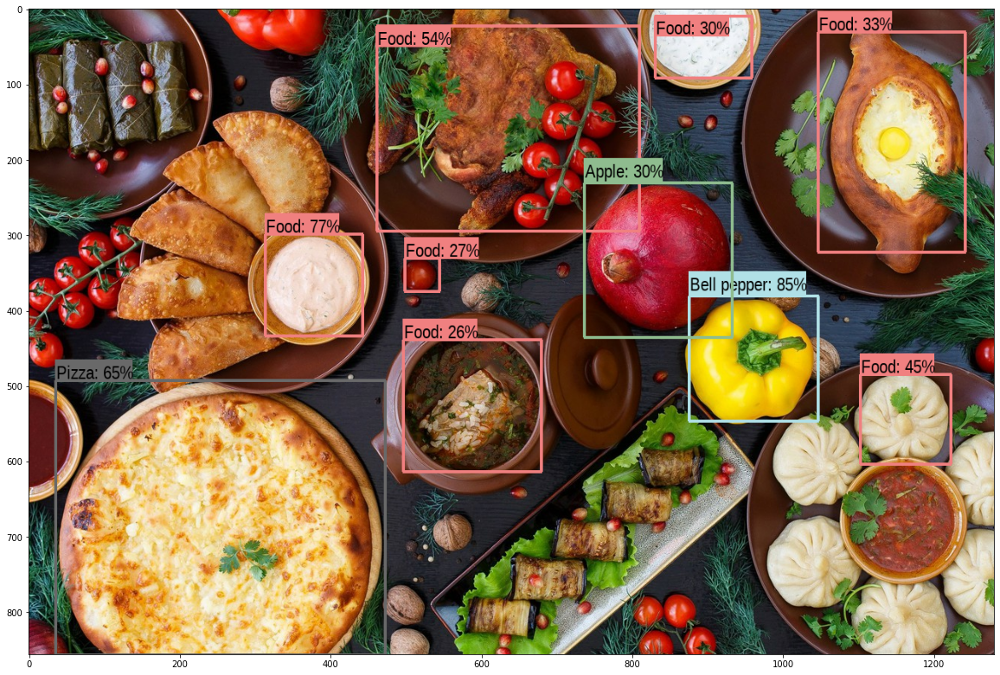

In [19]:
run_detector(detector, downloaded_image_path)

Found 100 objects.
Inference time:  1.2447643280029297


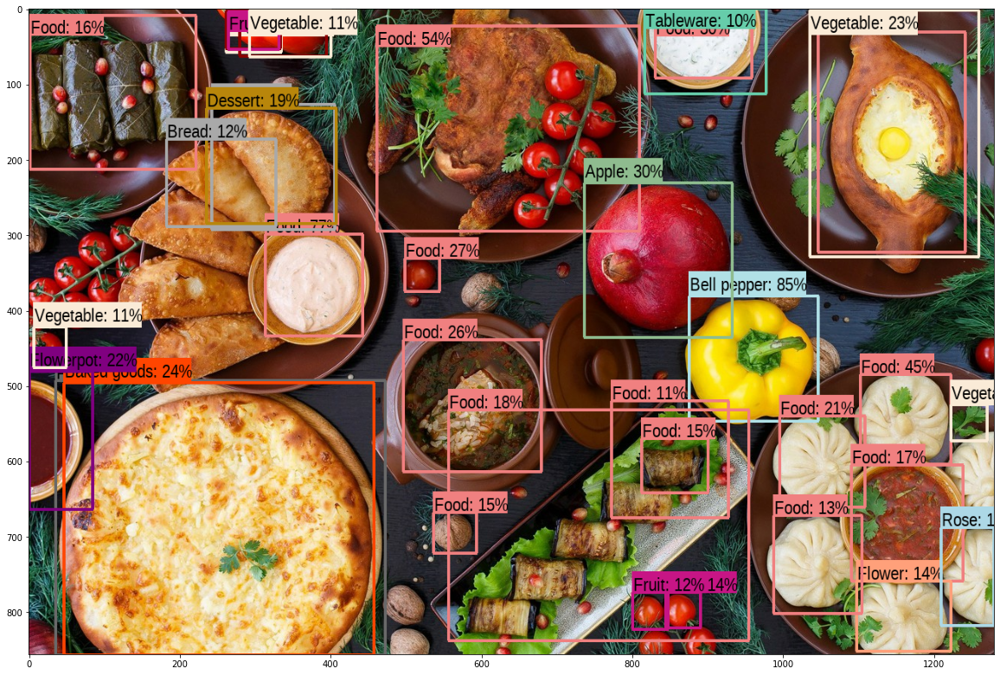

In [21]:
run_detector(detector, downloaded_image_path)

Image downloaded to /tmp/tmpxks5z39w.jpg.


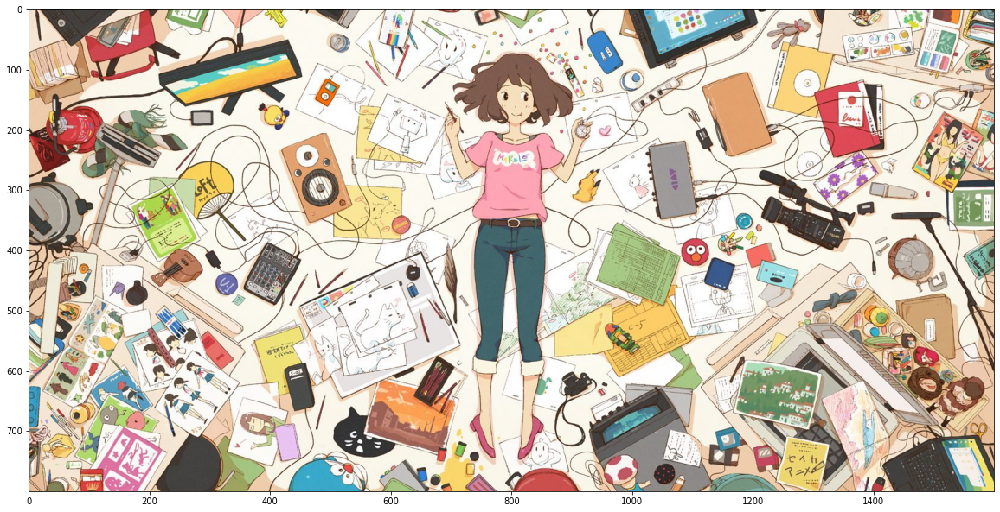

In [30]:

image_url = "https://kartinkin.net/uploads/posts/2021-07/1627003803_14-kartinkin-com-p-khlam-anime-anime-krasivo-17.jpg"  #@param 
downloaded_image_path = download_and_resize_image(image_url, 1600, 800, True)

Found 100 objects.
Inference time:  3.3060476779937744


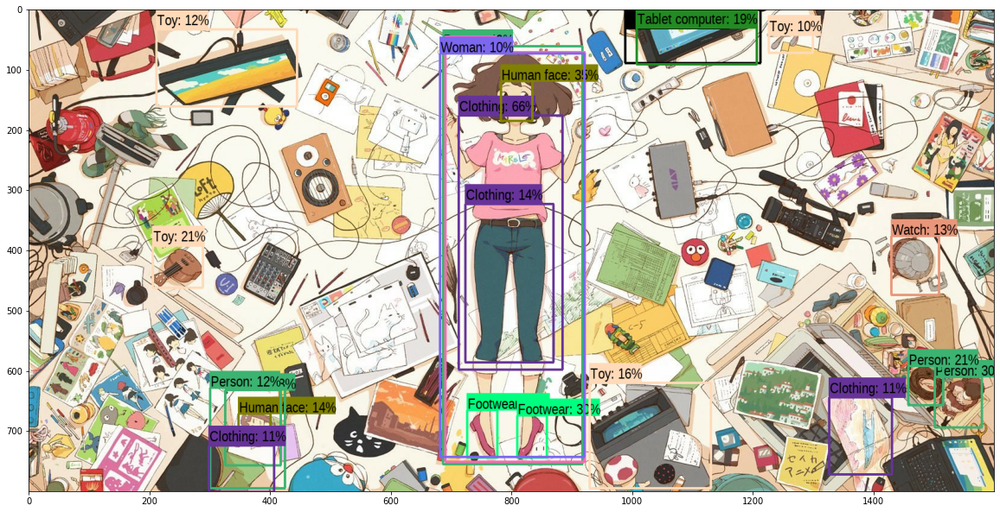

In [31]:
run_detector(detector, downloaded_image_path)